# Vineyard Layout Optimization — Review Notebook

Quick walkthrough of the pipeline for you to poke at. Runs the SGD layout optimizer on the
Vineyard farm, then refines the cable network with an exact MILP solver as a warm-start step,
and shows AEP/LCOE convergence.

Everything here calls straight into `Optimize_farm.py`, `Warm_Start_Cables.py` and
`Plot_Convergence.py` -- this notebook isnt a separate implementation, its just a runnable
walkthrough of the same code with some visuals stitched in.

**Heads up:** this uses a reduced iteration count and a shortened MILP time limit so the whole
thing runs in a few minutes during a review session instead of the full ~100 iterations / 90s+
MILP solve. The cell that actually runs the optimization has the params clearly marked if you
want to bump them up for a "real" run.

Outputs get written to `Results_Notebook_Review/` -- a separate folder from `Results_Nash_Run/`
(what `Optimize_farm.py` uses when run directly), so running this notebook won't clobber your
existing results and vice versa.

**Run the cell right below first** -- it checks/installs everything this notebook needs, so it
should work even on a machine that never ran this pipeline before.

In [1]:
# ============================================================
# ENVIRONMENT CHECK -- run this first. Makes sure every package this notebook
# needs is importable in THIS kernel, installing whatever's missing.
# ============================================================
import importlib.util
import subprocess
import sys

# import name -> pip package name (only differ for py_wake, see note below)
REQUIRED_PACKAGES = {
    'numpy': 'numpy',
    'scipy': 'scipy',
    'matplotlib': 'matplotlib',
    'xarray': 'xarray',
    'shapely': 'shapely',
    'openmdao': 'openmdao',
    'windIO': 'windIO',
    # DTU's wake model. Careful: PyPI's "pywake" (no underscore) is a totally
    # unrelated Wake-on-LAN network tool -- installing THAT instead would silently
    # break everything downstream, so the import name and pip name must both use
    # the underscore here.
    'py_wake': 'py_wake',
    'optiwindnet': 'optiwindnet',
    # Not imported directly anywhere in our own code, but optiwindnet's MILPRouter
    # calls out to it at runtime (solver_name='ortools.cp_sat') -- if it's missing
    # the warm-start cell near the end fails, not this cell, so check it explicitly.
    'ortools': 'ortools',
}

missing = [name for name in REQUIRED_PACKAGES if importlib.util.find_spec(name) is None]

if missing:
    print(f"Missing packages: {missing} -- installing into this kernel's environment...")
    for name in missing:
        pip_name = REQUIRED_PACKAGES[name]
        print(f"  pip install {pip_name} ...")
        result = subprocess.run([sys.executable, '-m', 'pip', 'install', '-q', pip_name],
                                 capture_output=True, text=True)
        if result.returncode != 0:
            print(result.stdout[-2000:])
            print(result.stderr[-2000:])
            raise RuntimeError(
                f"Could not install '{pip_name}' automatically. Install it manually in this "
                f"kernel's environment (`{sys.executable} -m pip install {pip_name}`) and re-run "
                f"this cell.")
    importlib.invalidate_caches()

# Actually import everything (not just find_spec) to catch broken installs, version
# conflicts, etc. -- and print versions so it's obvious what's actually running.
import numpy, scipy, matplotlib, xarray, shapely, openmdao, windIO, py_wake, optiwindnet, ortools

print("All required packages available:")
for mod in [numpy, scipy, matplotlib, xarray, shapely, openmdao, windIO, py_wake, optiwindnet, ortools]:
    print(f"  {mod.__name__:<12s} {getattr(mod, '__version__', '?')}")
print("\nEnvironment OK -- safe to run the rest of the notebook.")

All required packages available:
  numpy        2.4.6
  scipy        1.17.1
  matplotlib   3.11.0
  xarray       2026.7.0
  shapely      2.1.2
  openmdao     3.39.0
  windIO       ?
  py_wake      2.6.20
  optiwindnet  0.2.2
  ortools      9.15.6755

Environment OK -- safe to run the rest of the notebook.


/opt/anaconda3/envs/Wind_2200/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import numpy as np
import openmdao.api as om
from pathlib import Path
import pickle
import windIO
import matplotlib.pyplot as plt
from IPython.display import Image, display

from Components.foundations import MonopileCurveFitter
from Components.plotting import FarmPlotter
from Optimize_farm import build_farm_model, opt_competitive
from Warm_Start_Cables import warm_start_cable_routing, default_milp_router
from Plot_Convergence import plot_convergence
from optiwindnet.api import MILPRouter, ModelOptions

# Separate output dir on purpose -- Optimize_farm.py's own __main__ writes to
# "Results_Nash_Run", we don't want this notebook stepping on that (or vice versa).
NOTEBOOK_OUTPUT_DIR = "Results_Notebook_Review"
Path(NOTEBOOK_OUTPUT_DIR).mkdir(parents=True, exist_ok=True)

FARM_NAME = "vineyard"
DATA_DIR = Path("Data")

## 1. What we're accounting for

Before building anything, here's the raw assumptions the model runs on: turbine specs, cable
catalogue, financial parameters. If these are wrong everything downstream is wrong too, so
worth eyeballing before we go any further.

In [3]:
SYSTEM_YAML = DATA_DIR / "vineyard_revolution_system.yaml"
SITE_YAML = DATA_DIR / "site_us.yaml"
BATHY_NC = DATA_DIR / "bathymetry_us.nc"

system_dat = windIO.load_yaml(SYSTEM_YAML)
site_dat = windIO.load_yaml(SITE_YAML)

wind_resource = system_dat['site']['energy_resource']['wind_resource']
site_resource_dict = {
    'directions': np.array(wind_resource['wind_direction']),
    'probabilities': np.array(wind_resource['sector_probability']['data']),
    'weibull_A': np.array(wind_resource['weibull_a']['data']),
    'weibull_k': np.array(wind_resource['weibull_k']['data']),
    'ws_TI': np.array(wind_resource['wind_speed']),
    'TI_org': wind_resource['turbulence_intensity']['data'],
}
site_resource_dict['probabilities'] /= site_resource_dict['probabilities'].sum()

# NOTE: Vineyard and Revolution carry different turbines (Haliade-X 13MW vs SG11-200
# 11MW). Foundation cost still uses a single curve fit on Vineyard's rotor for both farms
# for now (todo, need a proper high-fidelity foundation pipeline eventually) but AEP/wake
# is turbine-aware per farm -- see farm_index / neighbor_farm_idx below.
rd_turbine = float(system_dat['wind_farm'][0]['turbines']['rotor_diameter'])
hub_height = float(system_dat['wind_farm'][0]['turbines']['hub_height'])
coefficients_foundation = MonopileCurveFitter.fit_surrogate(rd=rd_turbine)

cable_specs = np.array([(3, 368.9), (5, 428.9), (7, 737.1)],
                        dtype=[('capacity', int), ('cost', float)])

print(f"Vineyard turbine: {rd_turbine:.0f} m rotor, {hub_height:.0f} m hub height")
print(f"Cable catalogue (capacity, EUR/m): {list(cable_specs)}")
print(f"Discount rate / lifetime / fixed CAPEX / annual OPEX -> see LCOEComp defaults in Components/lcoe_comp.py")

Vineyard turbine: 220 m rotor, 150 m hub height
Cable catalogue (capacity, EUR/m): [np.void((3, 368.9), dtype=[('capacity', '<i8'), ('cost', '<f8')]), np.void((5, 428.9), dtype=[('capacity', '<i8'), ('cost', '<f8')]), np.void((7, 737.1), dtype=[('capacity', '<i8'), ('cost', '<f8')])]
Discount rate / lifetime / fixed CAPEX / annual OPEX -> see LCOEComp defaults in Components/lcoe_comp.py


In [4]:
# quick visual on the cable catalogue -- cost per meter by capacity tier
fig, ax = plt.subplots(figsize=(5, 3.5))
ax.bar([str(int(c)) for c in cable_specs['capacity']], cable_specs['cost'], color='#d97b29')
ax.set_xlabel("Cable capacity (turbines fed)")
ax.set_ylabel("Cost (EUR / m)")
ax.set_title("Cable catalogue")
ax.grid(True, axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

/var/folders/1j/_3qt8y3s02n_m1mtt8pcvnh00000gr/T/ipykernel_81448/3591673526.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [5]:
# Fresh farm_data_registry every call -- opt_competitive() mutates x_init/y_init in
# place after running, so rebuilding here keeps re-running cells below reproducible
# (always starts from the true YAML layout, not wherever a previous run left off).
def build_registry():
    registry = {}
    for idx, farm_name in enumerate(["vineyard", "revolution"]):
        farm_node = system_dat['wind_farm'][idx]
        layout_node = farm_node['layouts'][0]['coordinates']
        x_init = np.array(layout_node['x'], dtype=float)
        y_init = np.array(layout_node['y'], dtype=float)
        sub_node = farm_node['electrical_substations'][0]['electrical_substation']['coordinates']
        substation_coord = np.array([[float(sub_node['x'][0]), float(sub_node['y'][0])]], dtype=float)
        poly_node = site_dat['boundaries']['polygons'][idx]
        boundary_vertices = np.column_stack((poly_node['x'], poly_node['y']))
        registry[farm_name] = {
            'site_yaml': site_resource_dict, 'system_yaml': system_dat, 'bathy_nc': BATHY_NC,
            'poly_coef': coefficients_foundation, 'boundary_vertices': boundary_vertices,
            'substation_coord': substation_coord, 'cable_specs': cable_specs,
            'x_init': x_init.copy(), 'y_init': y_init.copy(), 'min_spacing': 4.0 * rd_turbine,
            'farm_index': idx,  # AEPComp needs this to pick its own turbine (see aep.py)
        }
    return registry

farm_data_registry = build_registry()
cfg = farm_data_registry[FARM_NAME]
n_wt = len(cfg['x_init'])
print(f"{FARM_NAME}: {n_wt} turbines, min spacing {cfg['min_spacing']:.0f} m")

# Revolution's turbines get injected as static neighbors below (Vineyard doesn't optimize
# in isolation -- Revolution's wake shadow onto Vineyard does matter). Tagged with their
# own farm_index so AEPComp casts their wake using Revolution's actual turbine (SG11-200
# 11MW), not Vineyard's -- see farm_index/neighbor_farm_idx plumbing in aep.py.
neighbor_x = np.concatenate([farm_data_registry[f]['x_init'] for f in farm_data_registry if f != FARM_NAME])
neighbor_y = np.concatenate([farm_data_registry[f]['y_init'] for f in farm_data_registry if f != FARM_NAME])
neighbor_farm_idx = np.concatenate([
    np.full(len(farm_data_registry[f]['x_init']), farm_data_registry[f]['farm_index'], dtype=int)
    for f in farm_data_registry if f != FARM_NAME
])
print(f"{len(neighbor_x)} neighbor turbines injected (from other registered farms)")

vineyard: 63 turbines, min spacing 880 m
80 neighbor turbines injected (from other registered farms)


## 2. Building the model

`build_farm_model()` wires up the OpenMDAO group -- same function `Optimize_farm.py` uses.
Quick rundown of what's in there:

- `aep_comp` -- PyWake wake model, gives AEP for a given layout. Uses `farm_index` to pick
  Vineyard's own turbine, and casts Revolution's neighbor wake using Revolution's own turbine
  (via `neighbor_farm_idx`) -- important since the two farms use different turbines now
- `cable_comp` -- OptiWindNet, routes + costs the cable network
- `foundations_comp` -- monopile mass/cost from bathymetry depth at each turbine
- `lcoe_comp` -- combines AEP + cable cost + foundation cost into LCOE
- `boundary_comp` / `spacing_comp` -- constraint values (distance to boundary, inter-turbine spacing)

In [6]:
prob = om.Problem()
prob.model = build_farm_model(
    farm_name=FARM_NAME,
    n_wt=n_wt,
    site_yaml_path=cfg['site_yaml'],
    system_yaml_path=cfg['system_yaml'],
    bathy_nc_path=cfg['bathy_nc'],
    poly_coefficients=cfg['poly_coef'],
    neighbor_x=neighbor_x,
    neighbor_y=neighbor_y,
    boundary_vertices=cfg['boundary_vertices'],
    substation_coord=cfg['substation_coord'],
    cable_specs=cfg['cable_specs'],
    min_spacing=cfg['min_spacing'],
    unconstrained_mode=True,   # matches the SGD driver branch we'll use below
    stochastic_mode=False,     # deterministic here on purpose, just want a clean sanity check
    farm_index=cfg['farm_index'],
    neighbor_farm_idx=neighbor_farm_idx,
)
prob.setup()
prob.set_val('turbine_x', cfg['x_init'])
prob.set_val('turbine_y', cfg['y_init'])
print("model built + setup OK")

model built + setup OK


## 3. Sanity check -- does it even run

One forward pass before touching the optimizer. If AEP or costs look like garbage here,
no point debugging convergence before fixing this.

In [7]:
prob.run_model()

cable_cost_0 = float(prob.get_val('cost_cables')[0])
foundation_cost_0 = np.asarray(prob.get_val('cost_foundations'))
aep_0 = float(prob.get_val('aep', units='MW*h')[0])

print(f"AEP (initial layout):        {aep_0:,.0f} MWh")
print(f"Cable CAPEX (initial):       {cable_cost_0:,.0f} EUR")
print(f"Foundation CAPEX (initial):  {foundation_cost_0.sum():,.0f} EUR  (range {foundation_cost_0.min():,.0f} - {foundation_cost_0.max():,.0f} per turbine)")

fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))
axes[0].bar(['Cable CAPEX', 'Foundation CAPEX'], [cable_cost_0, foundation_cost_0.sum()], color=['#d97b29', '#1f4e8c'])
axes[0].set_ylabel("EUR")
axes[0].set_title("Initial CAPEX breakdown")
axes[0].grid(True, axis='y', linestyle='--', alpha=0.4)

axes[1].hist(foundation_cost_0, bins=15, color='#1f4e8c', alpha=0.8)
axes[1].set_xlabel("Foundation cost per turbine (EUR)")
axes[1].set_ylabel("count")
axes[1].set_title("spread (depth-driven)")
plt.tight_layout()
plt.show()

/opt/anaconda3/envs/Wind_2200/lib/python3.11/site-packages/openmdao/core/group.py:2971: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v0' with units of 'm' is connected to input 'cable_comp.turbine_x' which has no units.
/opt/anaconda3/envs/Wind_2200/lib/python3.11/site-packages/openmdao/core/group.py:2971: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v1' with units of 'm' is connected to input 'cable_comp.turbine_y' which has no units.


AEP (initial layout):        3,595,512 MWh
Cable CAPEX (initial):       79,035,596 EUR
Foundation CAPEX (initial):  1,848,350,493 EUR  (range 25,321,343 - 35,319,603 per turbine)


/var/folders/1j/_3qt8y3s02n_m1mtt8pcvnh00000gr/T/ipykernel_81448/3513050489.py:22: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


## 4. Starting layout (before anything moves)

this is the x_init / y_init straight from the windIO yaml -- literally where the optimizer
warm starts from, no optimization applied yet.

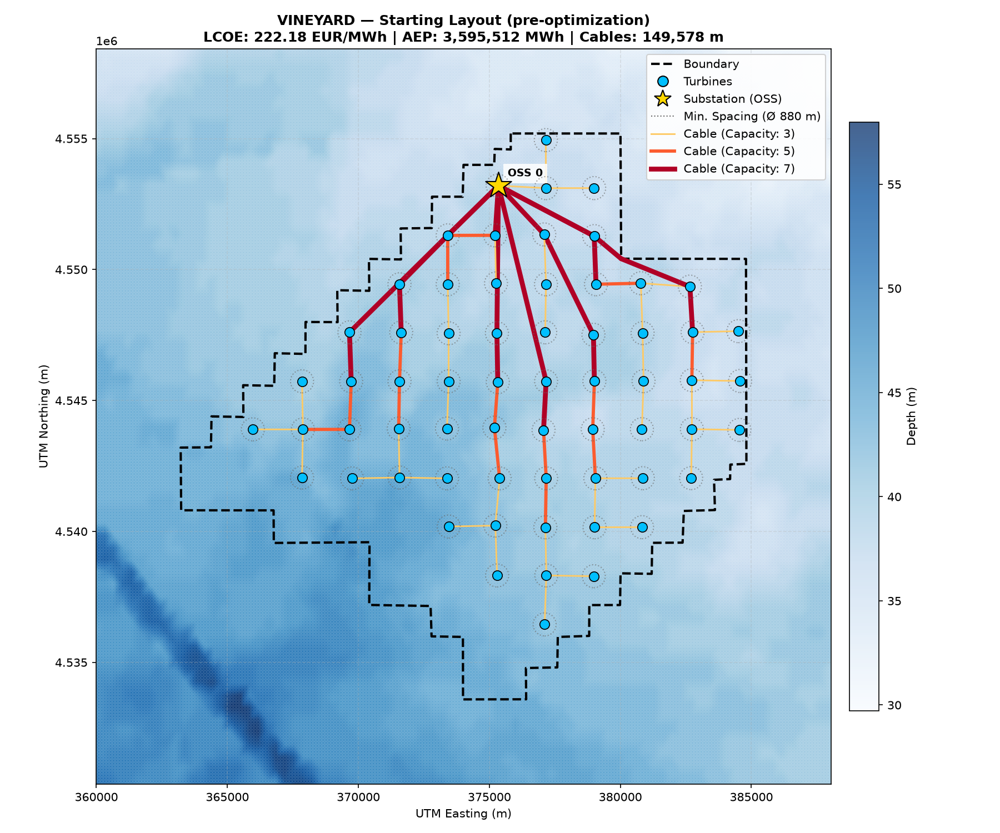

In [8]:
plotter_preview = FarmPlotter(
    farm_name=FARM_NAME,
    boundary_vertices=cfg['boundary_vertices'],
    substation_coord=cfg['substation_coord'],
    cable_specs=cfg['cable_specs'],
    bathy_nc_path=cfg['bathy_nc'],
    output_dir=Path(NOTEBOOK_OUTPUT_DIR) / "plots" / FARM_NAME,
    min_spacing=cfg['min_spacing'],
)
initial_plot_path = plotter_preview.save_iteration_plot(
    cycle=1, iteration=0,
    turbine_x=cfg['x_init'], turbine_y=cfg['y_init'],
    wfn=getattr(prob.model.cable_comp, 'wfn', None),
    lcoe=float(prob.get_val('lcoe')[0]), aep=aep_0,
    tag='notebook_start', label='Starting Layout (pre-optimization)',
)
display(Image(filename=str(initial_plot_path)))

## 5. Running the optimization -- edit here

This is the actual optimization call, `opt_competitive()` from `Optimize_farm.py`. It handles
the Nash loop / plotting / convergence logging for us, so no need to rebuild the Problem again
by hand like above.

**Params below the `# EDIT` line are safe to change and re-run this cell:**

- `MAX_ITER` -- more iterations = better convergence, slower. Kept low here for review speed
  (the "real" run in `Optimize_farm.py`'s `__main__` uses 100)
- `SAMPLE_SIZE` -- bigger = less noisy stochastic gradient per step, slower per iteration
- `OBJECTIVE` -- `'lcoe'` (default) or `'aep'` if you want to see pure AEP maximization instead
- `TOL` -- Nash equilibrium tolerance in meters, only matters with >1 farm in `farm_sequence`

Everything else (learning rate, beta1/beta2, penalty schedule) lives inside the `SGD` driver
in `Components/Drivers.py` -- wouldn't touch those without a reason.

In [9]:
# ============================================================
# EDIT THESE
# ============================================================
MAX_ITER = 20
SAMPLE_SIZE = 100
OBJECTIVE = 'lcoe'          # 'lcoe' or 'aep'
TOL = 2.0
# ============================================================

farm_data_registry = build_registry()  # fresh copy, see note in the function above

opt_competitive(
    farm_sequence=[FARM_NAME],
    max_cycles=1,
    farm_data_registry=farm_data_registry,
    optimizer='SGD',
    stochastic_mode=True,
    sample_size=SAMPLE_SIZE,
    max_iter=MAX_ITER,
    tol=TOL,
    output_dir=NOTEBOOK_OUTPUT_DIR,
    save_plots=True,
    plot_every=5,           # only snapshot every 5th iteration, keeps the folder from filling up
    log_convergence=True,
    log_every=1,            # log every iteration though, want a smooth curve
    objective=OBJECTIVE,
)

=== INITIALIZING COMPETITIVE LAYOUT OPTIMIZATION ===
Active Sequence: ['vineyard']
Unconstrained Aggregation Mode: True


   STARTING GLOBAL NASH CYCLE 1 / 1

--- Optimizing Active Asset: VINEYARD ---
Injecting 80 static neighbor turbines into PyWake environment.


/opt/anaconda3/envs/Wind_2200/lib/python3.11/site-packages/openmdao/core/group.py:2971: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v0' with units of 'm' is connected to input 'cable_comp.turbine_x' which has no units.
/opt/anaconda3/envs/Wind_2200/lib/python3.11/site-packages/openmdao/core/group.py:2971: UnitsWarning:<model> <class Group>: Output '_auto_ivc.v1' with units of 'm' is connected to input 'cable_comp.turbine_y' which has no units.


--- UNITS AND SCALE AUDIT ---
Raw cable CAPEX: [79035595.70404597] EUR
Raw foundation CAPEX: [26074261.16072908 25321342.52625519 27068904.15918608 26921771.02474812
 27831669.13779229 28431304.96897825 26340124.99497318 26616374.66398452
 29503702.47426533 29503702.47426533 27376779.14254754 27234893.1334906
 27428160.85769577 27376779.14254754 26140513.95643117 26084977.3248397
 26340124.99497319 28304067.61936534 28431304.96897825 28321546.65470297
 28431304.96897825 28458110.59504949 29713915.93498132 29684923.48352872
 30492304.36638569 32828125.06326472 30911191.88119708 31461065.18134531
 30127933.17085048 29861702.35933298 28836364.13155328 28104935.88869381
 25756832.62845764 26168865.41087351 26578634.50387897 27376779.14254754
 27376779.14254754 26015529.55637679 27710007.91345453 31542067.1020313
 31702112.52140857 32548297.18676268 34718972.08899731 31663699.9095086
 31742790.10547546 35319603.42789771 35133765.18354613 34893078.232229
 33735001.56158949 31393415.02919921 

/opt/anaconda3/envs/Wind_2200/lib/python3.11/site-packages/openmdao/utils/coloring.py:447: DerivativesWarning:Coloring was deactivated.  Improvement of 0.0% was less than min allowed (5.0%).
/opt/anaconda3/envs/Wind_2200/lib/python3.11/site-packages/openmdao/utils/coloring.py:447: DerivativesWarning:Coloring was deactivated.  Improvement of 0.0% was less than min allowed (5.0%).


No coloring was computed successfully.


Adam Iter:   1 | lcoe: 231.0081 | Multiplier (Alpha): 7.57e-05 | |G|inf: 2.5710e-03


Adam Iter:   5 | lcoe: 222.7456 | Multiplier (Alpha): 1.17e-04 | |G|inf: 3.1936e-03


Adam Iter:  10 | lcoe: 243.6284 | Multiplier (Alpha): 4.68e-04 | |G|inf: 3.2769e-03


Adam Iter:  15 | lcoe: 198.4249 | Multiplier (Alpha): 4.21e-03 | |G|inf: 1.3533e-03


Adam Iter:  20 | lcoe: 231.7513 | Multiplier (Alpha): 7.57e-02 | |G|inf: 2.4646e-03



STOCHASTIC OPTIMIZATION CYCLE CONCLUDED.
Total Iterations: 20
Final Gradient Norm: 2.464580e-03


Round finished in 66.99 s. Maximum turbine displacement: 96.86 m.
AEP: 3,682,799.13 MWh | LCOE: 217.0061 EUR/MWh
(Driver's last stochastic mini-batch estimate: AEP 3,962,467.47 MWh | LCOE 201.6899 EUR/MWh)
[Exported] Convergence history saved to: Results_Notebook_Review/convergence_vineyard_cycle_1.pkl
[Exported] Checkpoint saved to: Results_Notebook_Review/checkpoint_vineyard_cycle_1.pkl

     COMPETITIVE OPTIMIZATION PIPELINE COMPLETE       


## 6. Optimized layout

Whatever `opt_competitive()` landed on after `MAX_ITER` iterations.

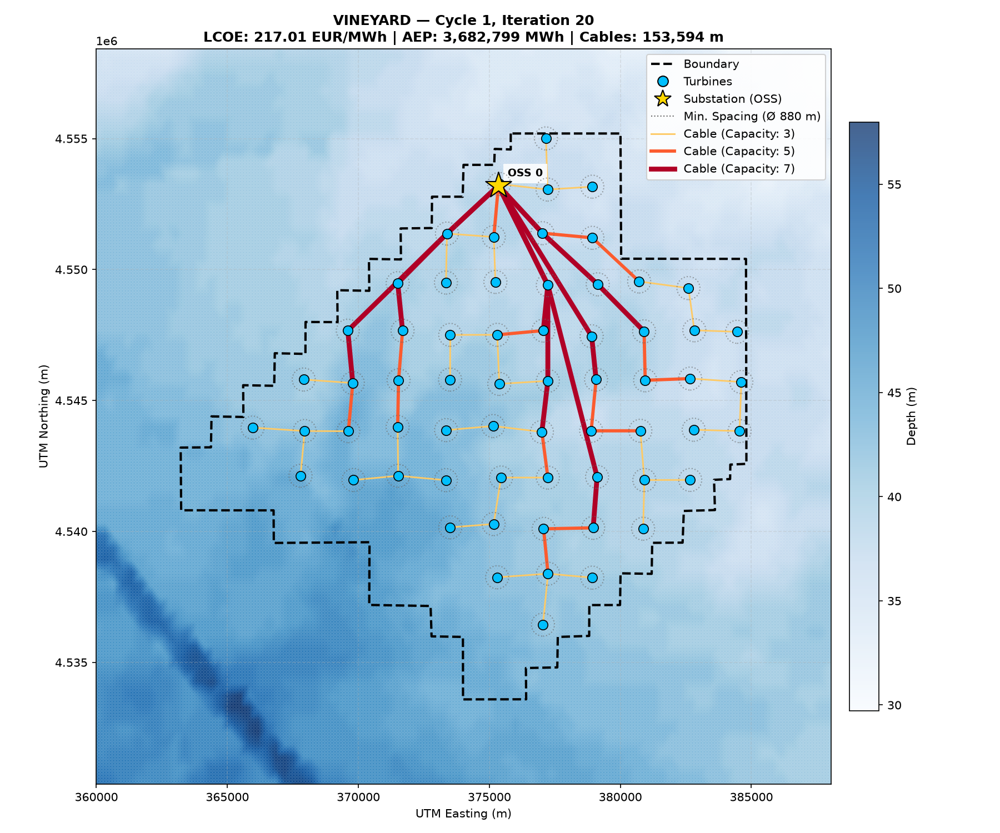

In [10]:
final_plots = sorted((Path(NOTEBOOK_OUTPUT_DIR) / "plots" / FARM_NAME).glob("*_final.png"))
if final_plots:
    display(Image(filename=str(final_plots[-1])))
else:
    print("no '_final' plot found -- did the optimization cell above finish OK?")

## 7. Convergence

AEP / LCOE vs iteration and vs wall-clock time, using the deterministic (full wind-rose)
re-evaluation at each step -- not the noisy stochastic mini-batch sample the driver actually
trains on. See `Plot_Convergence.py` docstring if curious why that distinction matters (short
version: the mini-batch estimate is way too noisy iteration-to-iteration to read a trend off of).

[Exported] Convergence plot saved to: Results_Notebook_Review/convergence_vineyard_cycle_1.png


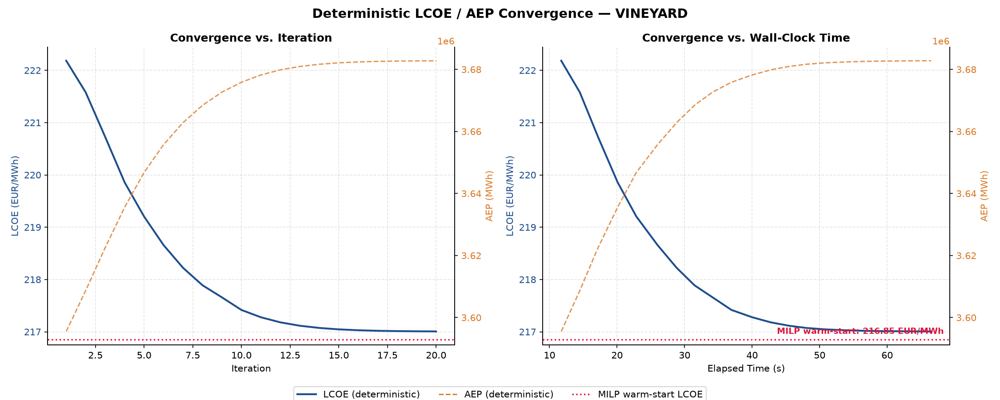

In [11]:
conv_path = Path(NOTEBOOK_OUTPUT_DIR) / f"convergence_{FARM_NAME}_cycle_1.pkl"
conv_plot_path = plot_convergence(conv_path)
display(Image(filename=str(conv_plot_path)))

## 8. Warm start: refining the cable network with MILP

The SGD loop above uses a fast heuristic (EWRouter) for cable routing every single iteration,
since it gets called ~20-100 times and needs to be quick. Once the layout is frozen after
optimization we can afford to spend real time on an exact MILP solver instead, to actually
optimize cable topology rather than just heuristically routing it.

Turbine positions are frozen at this point -- this step only touches the cable network, AEP
carries over unchanged.

Note: shortened the solver time limit to 45s here for the demo (default in
`Warm_Start_Cables.py` is 90s) -- bump it up for a real analysis, MILP quality generally
improves with more time.

In [12]:
demo_router = MILPRouter(
    solver_name='ortools.cp_sat', time_limit=45, mip_gap=0.005,
    model_options=ModelOptions(topology='branched', feeder_limit='minimum', feeder_route='segmented'),
    verbose=False,
)

checkpoint_path = Path(NOTEBOOK_OUTPUT_DIR) / f"checkpoint_{FARM_NAME}_cycle_1.pkl"
milp_result = warm_start_cable_routing(checkpoint_path, router=demo_router)

=== WARM-START CABLE ROUTING: VINEYARD / cycle 1 ===
Router: MILPRouter | Runtime: 45.19 s
vs. EWRouter baseline -> Length: +9,431.14 m | Cost: +6,330,226.46 EUR
Cable cost: 76,053,709.64 EUR | Cable length: 144,163.03 m
LCOE: 216.8637 EUR/MWh (AEP frozen at 3,682,799.13 MWh)
[Exported] Warm-start checkpoint saved to: Results_Notebook_Review/checkpoint_vineyard_cycle_1_milp.pkl


[Exported] Final plot saved to: Results_Notebook_Review/plots/vineyard/vineyard_cycle01_iter0000_milp_final.png


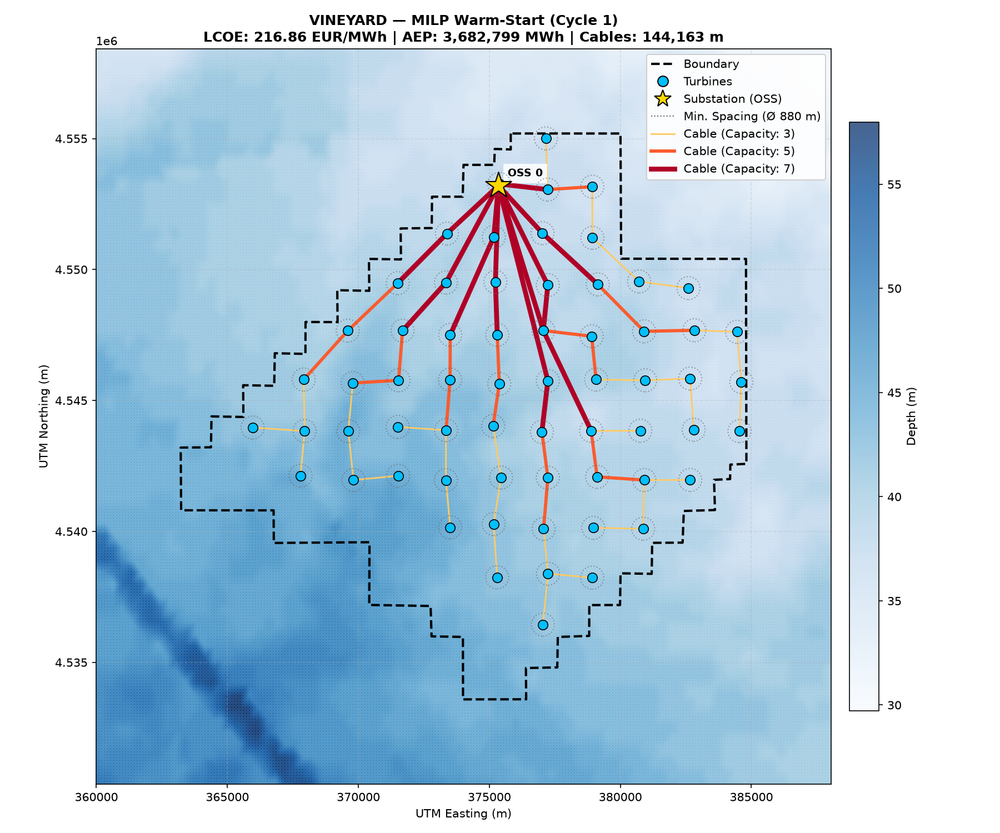

In [13]:
display(Image(filename=milp_result['plot_path']))

## wrap up

quick before/after summary below. Numbers will move around a bit between runs since the driver
is stochastic (different random wind draws each time) -- that's expected, not a bug, see the
convergence plot above for how much noise to expect at this `SAMPLE_SIZE`.

if you want the full-length run (100 iterations, full MILP time budget) just bump `MAX_ITER`
and `time_limit` back up in the cells above and re-run -- everything else stays the same.

In [14]:
with open(checkpoint_path, 'rb') as f:
    final_ckpt = pickle.load(f)

print(f"{'':25s}{'start':>15s}{'after SGD':>18s}{'after MILP':>18s}")
print(f"{'AEP (MWh)':25s}{aep_0:>15,.0f}{final_ckpt['aep_mwh']:>18,.0f}{milp_result['aep_mwh']:>18,.0f}")
print(f"{'LCOE (EUR/MWh)':25s}{float(prob.get_val('lcoe')[0]):>15.2f}{final_ckpt['lcoe_eur_mwh']:>18.2f}{milp_result['lcoe_eur_mwh']:>18.2f}")
print(f"{'Cable cost (EUR)':25s}{cable_cost_0:>15,.0f}{final_ckpt['cost_cables_eur']:>18,.0f}{milp_result['cost_cables_eur']:>18,.0f}")
print(f"{'Cable length (m)':25s}{'--':>15s}{final_ckpt['cable_network']['length_m']:>18,.0f}{milp_result['cable_network']['length_m']:>18,.0f}")

                                   start         after SGD        after MILP
AEP (MWh)                      3,595,512         3,682,799         3,682,799
LCOE (EUR/MWh)                    222.18            217.01            216.86
Cable cost (EUR)              79,035,596        82,383,936        76,053,710
Cable length (m)                      --           153,594           144,163
